In [1]:
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
%matplotlib inline

In [2]:
cars = []
notcars = []

In [3]:
for filename in glob.iglob('non-vehicles/**/*.png', recursive=True):
    notcars.append(filename)

In [4]:
for filename in glob.iglob('vehicles/**/*.png', recursive=True):
    cars.append(filename)

In [5]:
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    # Define a key "image_shape" and store the test image shape 3-tuple
    image = mpimg.imread(car_list[0])
    data_dict["image_shape"] = image.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = image.dtype
    # Return data_dict
    return data_dict

In [6]:
data_info = data_look(cars, notcars)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])

Your function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32


Text(0.5,1,'Example Not-car Image')

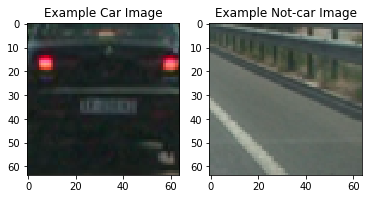

In [7]:
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Not-car Image')

In [8]:
from sklearn import svm, grid_search, datasets
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split

/Users/amrosebirani/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Users/amrosebirani/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [9]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [10]:
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

In [11]:
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [12]:
def extract_features(imgs, color_space='RGB',
                     spatial_size=(32, 32), hist_bins=32, orient=9,
                     pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [13]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [14]:
# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [73]:
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

In [74]:
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

In [75]:
X = np.vstack((car_features, notcar_features)).astype(np.float64)  

#X[np.isnan(X)] = np.median(X[~np.isnan(X)])
# Fit a per-column scaler
#X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
#scaled_X = X_scaler.transform(X)

# Define the labels vector
#y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

In [76]:
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

In [77]:
# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460


In [78]:
import time
#parameters = {'kernel':('linear', 'rbf'), 'C':[0.1, 1, 10], 'gamma':[0.1, 1, 10]}
#svc = svm.SVC(kernel='linear')
#svc = grid_search.GridSearchCV(svr, parameters)
svc = svm.LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
#print(svc.best_params_)
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

48.74 Seconds to train SVC...
Test Accuracy of SVC =  0.9896


In [79]:
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

In [80]:
def grid_display(list_of_images,  no_of_columns=4, figsize=(10,10)):

    fig = plt.figure(figsize=figsize)
    column = 0
    for i in range(len(list_of_images)):
        column += 1
        #  check for end of column and create a new figure
        if column == no_of_columns+1:
            fig = plt.figure(figsize=figsize)
            column = 1
        fig.add_subplot(1, no_of_columns, column)
        plt.imshow(list_of_images[i])

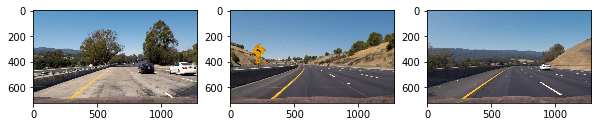

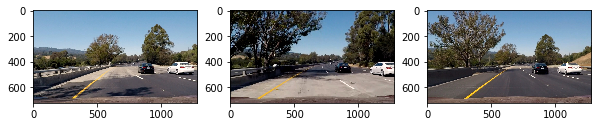

In [30]:
test_images = []
for i in range(7):
    if i == 0:
        continue
    image_path = "./test_images/test" + str(i) + ".jpg"
    img = mpimg.imread(image_path)
    img = img.astype(np.float32)/255
    test_images.append(img)

grid_display(test_images, 3, (10,10))

In [81]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = img_tosearch
    if color_space != 'RGB':
        if color_space == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    box_list = []
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            subimg_features = []
          
            # Get color features
            if spatial_feat == True:
                spatial_features = bin_spatial(subimg, size=spatial_size)
                subimg_features.append(spatial_features)
            
            if hist_feat == True:
                hist_features = color_hist(subimg, nbins=hist_bins)
                subimg_features.append(hist_features)
            
            if hog_feat == True:
                subimg_features.append(hog_features)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.concatenate(subimg_features).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                box_list.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)))
                #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                
    return box_list

In [32]:
img = mpimg.imread('test_images/test5.jpg')

In [33]:
img.shape


(720, 1280, 3)

In [34]:
ystart = 400
ystop = 700
scale = 1.5

/Users/amrosebirani/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


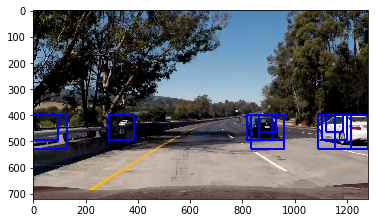

In [35]:
boxes1 = find_cars(img, ystart, 480, 1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
out_img = draw_boxes(img, boxes1)

boxes2 = find_cars(img, ystart, 530, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
out_img = draw_boxes(out_img, boxes2)

boxes3 = find_cars(img, ystart, 560, 2, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
out_img = draw_boxes(out_img, boxes3)

boxes4 = find_cars(img, ystart, 650, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
out_img = draw_boxes(out_img, boxes4)


plt.imshow(out_img)

In [36]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

In [37]:
heat = np.zeros_like(img[:,:,0]).astype(np.float)

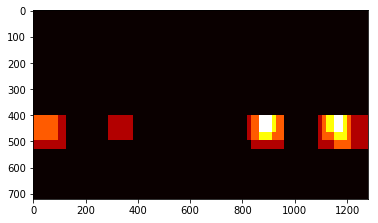

In [38]:
heat = add_heat(heat,boxes1)
heat = add_heat(heat,boxes2)
heat = add_heat(heat,boxes3)
heat = add_heat(heat,boxes4)
heatmap = np.clip(heat, 0, 255)
plt.imshow(heatmap, cmap='hot')

In [39]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

In [44]:
heat_threshold = apply_threshold(heat,1)

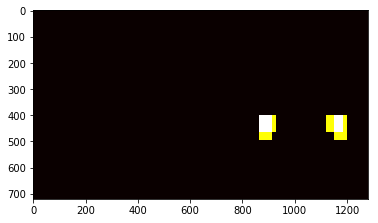

In [45]:
heatmap = np.clip(heat_threshold, 0, 255)
plt.imshow(heatmap, cmap='hot')

In [46]:
from scipy.ndimage.measurements import label

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def get_labeled_bboxes(labels):
    bboxes = []
    for car_number in range(1, labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        bboxes.append(bbox)
    return bboxes

In [47]:
labels = label(heatmap)
boxes = get_labeled_bboxes(labels)
print (boxes)


[((864, 400), (927, 495)), ((1120, 400), (1199, 495))]


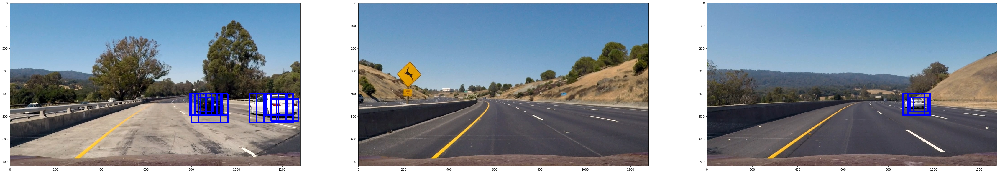

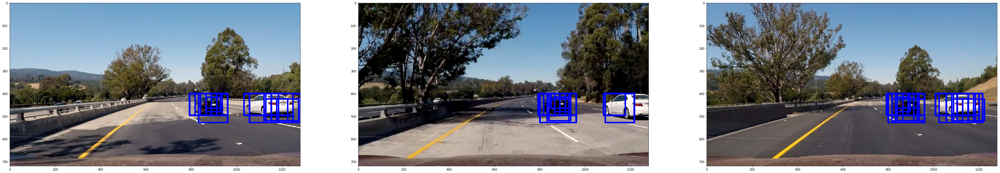

In [86]:
display_images = []

for i in range(7):
    if i == 0:
        continue
    image_path = "./test_images/test" + str(i) + ".jpg"
    img = mpimg.imread(image_path)
    boxes1 = find_cars(img, ystart, 480, 1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    out_img = draw_boxes(img, boxes1)
    boxes2 = find_cars(img, ystart, 530, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    out_img = draw_boxes(out_img, boxes2)
    boxes3 = find_cars(img, ystart, 560, 2, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    out_img = draw_boxes(out_img, boxes3)
    boxes4 = find_cars(img, ystart, 650, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    out_img = draw_boxes(out_img, boxes3)
    display_images.append(out_img)

grid_display(display_images, 3, (60,60))

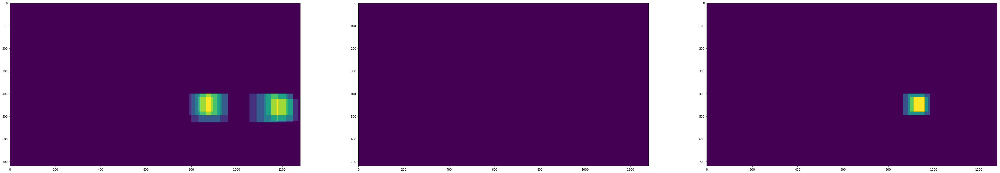

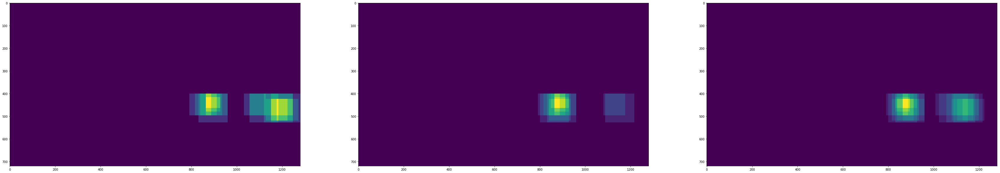

In [87]:
display_images = []

for i in range(7):
    if i == 0:
        continue
    image_path = "./test_images/test" + str(i) + ".jpg"
    img = mpimg.imread(image_path)
    boxes1 = find_cars(img, ystart, 480, 1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    boxes2 = find_cars(img, ystart, 530, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    boxes3 = find_cars(img, ystart, 560, 2, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    boxes4 = find_cars(img, ystart, 650, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat,boxes1)
    heat = add_heat(heat,boxes2)
    heat = add_heat(heat,boxes3)
    heat = add_heat(heat,boxes4)
    heatmap = np.clip(heat, 0, 255)
    display_images.append(heatmap)

grid_display(display_images, 3, (60,60))

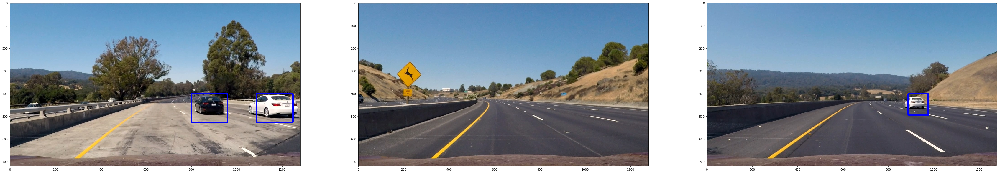

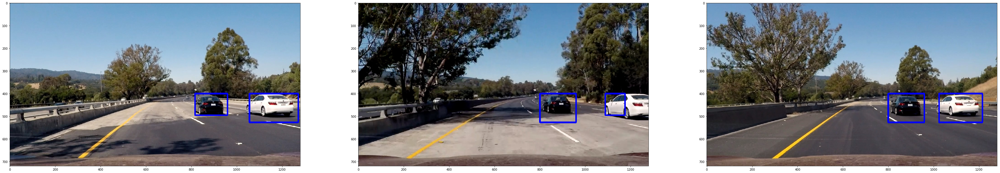

In [88]:
display_images = []

for i in range(7):
    if i == 0:
        continue
    image_path = "./test_images/test" + str(i) + ".jpg"
    img = mpimg.imread(image_path)
    boxes1 = find_cars(img, ystart, 480, 1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    boxes2 = find_cars(img, ystart, 530, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    boxes3 = find_cars(img, ystart, 560, 2, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    boxes4 = find_cars(img, ystart, 650, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat,boxes1)
    heat = add_heat(heat,boxes2)
    heat = add_heat(heat,boxes3)
    heat_threshold = apply_threshold(heat,1)
    heatmap = np.clip(heat_threshold, 0, 255)
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    display_images.append(draw_img)

grid_display(display_images, 3, (60,60))

In [89]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [125]:
from sklearn import linear_model

class BoundingBox(object):
    def __init__(self, bbox, center):
        self.boxes = [bbox]
        self.identification_count = 1
        self.successvive_non_identified_frame_count = 0
        self.enabled = True
        self.centers = [center]
    
    def check_enabled(self):
        if self.successvive_non_identified_frame_count > 3:
            self.enabled = False
    def check_closeness(self, center):
        last_center = self.centers[-1]
        distance = (last_center[0] - center[0]) ** 2 + (last_center[0] - center[0]) ** 2
        if distance < 200:
            return True
        return False
    def add_identification(self, bbox, center): 
        self.boxes.append(bbox)
        self.identification_count += 1
        self.centers.append(center)
        self.successvive_non_identified_frame_count = 0
    
    def predict_identification(self):
        if self.successvive_non_identified_frame_count > 3:
            self.enabled = False
            return
        total_centers = len(self.centers)
        if total_centers < 3:
            self.enabled = False
            return
        self.successvive_non_identified_frame_count += 1
        X = np.arange(total_centers).reshape(-1,1)
        Y = np.array(self.centers)
        regr = linear_model.LinearRegression()
        regr.fit(X,Y)
        new_center = regr.predict(np.array([[total_centers]]))[0].astype(np.int)
        old_center = self.centers[-1]
        self.centers.append(new_center)
        current_bbox = self.boxes[-1]
        ctop_left = current_bbox[0]
        cbottom_right = current_bbox[1]
        top_left = (new_center[0] - old_center[0] + ctop_left[0] , new_center[1] - old_center[1] + ctop_left[1])
        bottom_right = (new_center[0] - old_center[0] + cbottom_right[0] , new_center[1] - old_center[1] + cbottom_right[1])
        bbox = (top_left, bottom_right)
        self.boxes.append(bbox)
        
        

In [126]:
class VehicleDetector(object):
    
    def __init__(self, debug=False):
        self.boxes = []
        self.debug = debug
    
    def draw_boxes(self, img, color=(0,0,255)):
        for box in self.boxes:
            if box.enabled and box.identification_count > 3:
                bbox = box.boxes[-1]
                cv2.rectangle(img, bbox[0], bbox[1], color, 6)
        return img
    
    def process_frame(self, img):
        boxes1 = find_cars(img, 400, 480, 1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        boxes2 = find_cars(img, 400, 530, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        boxes3 = find_cars(img, 400, 560, 2, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        boxes4 = find_cars(img, 400, 650, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        heat = np.zeros_like(img[:,:,0]).astype(np.float)
        heat = add_heat(heat,boxes1)
        heat = add_heat(heat,boxes2)
        heat = add_heat(heat,boxes3)
        heat = add_heat(heat,boxes4)
        total_smooth_added = 0
        for box in self.boxes:
            if box.enabled:
                old_boxes = box.boxes[-2:]
                total_smooth_added += len(old_boxes)
                heat = add_heat(heat, old_boxes)
        heat_threshold = apply_threshold(heat, 2)
        #heat_threshold = apply_threshold(heat, 1)
        labels = label(heat_threshold)
        bboxes = get_labeled_bboxes(labels)
        if self.debug:
            draw_img = self.draw_boxes(np.copy(img), color=(0,255,255))
        else:
            draw_img = img
        
        for bbox in bboxes:
            centerx = int((bbox[1][0] + bbox[0][0])/2)
            centery = int((bbox[1][1] + bbox[0][1])/2)
            found = False
            for box in self.boxes:
                if not box.enabled:
                    continue
                if box.check_closeness([centerx, centery]):
                    found = True
                    box.add_identification(bbox, [centerx, centery])
                    break
            if not found:
                if centery > 400 and centerx > 700 :
                    self.boxes.append(BoundingBox(bbox, [centerx, centery]))
        for bounding_box in self.boxes:
            if not bounding_box.enabled:
                continue
            found = False
            for bbox in bboxes:
                centerx = int((bbox[1][0] + bbox[0][0])/2)
                centery = int((bbox[1][1] + bbox[0][1])/2)
                if bounding_box.check_closeness([centerx, centery]):
                    found = True
                    break
            if not found:
                bounding_box.predict_identification()
        draw_img = self.draw_boxes(np.copy(draw_img))
        if self.debug:
            draw_img = draw_boxes(draw_img, boxes1, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, boxes2, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, boxes3, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, boxes4, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, bboxes, color=(0, 255, 0), thick=6)
        return draw_img
                

In [109]:
vehicle_detector = VehicleDetector(debug=True)

In [110]:
output_video = 'DebugVideo.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(5,)
clip = clip1.fl_image(vehicle_detector.process_frame)
%time clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video DebugVideo.mp4
[MoviePy] Writing video DebugVideo.mp4



 13%|█▎        | 152/1136 [01:49<12:15,  1.34it/s]


 27%|██▋       | 303/1136 [03:33<09:45,  1.42it/s]


 40%|███▉      | 454/1136 [05:37<08:28,  1.34it/s]


 53%|█████▎    | 605/1136 [07:33<06:26,  1.37it/s]


 67%|██████▋   | 756/1136 [09:37<03:53,  1.63it/s]


 80%|███████▉  | 907/1136 [11:09<02:14,  1.70it/s]


 93%|█████████▎| 1057/1136 [12:53<00:46,  1.70it/s]


100%|█████████▉| 1135/1136 [13:39<00:00,  1.68it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: DebugVideo.mp4 

CPU times: user 12min 8s, sys: 44 s, total: 12min 52s
Wall time: 13min 40s


In [111]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))

In [127]:
vehicle_detector_f = VehicleDetector()

In [128]:
video = 'Video.mp4'
clip2 = VideoFileClip("project_video.mp4")
clipv = clip2.fl_image(vehicle_detector_f.process_frame)
%time clipv.write_videofile(video, audio=False)

[MoviePy] >>>> Building video Video.mp4
[MoviePy] Writing video Video.mp4



 12%|█▏        | 152/1261 [01:52<12:33,  1.47it/s]


 24%|██▍       | 303/1261 [03:39<11:07,  1.43it/s]


 36%|███▌      | 454/1261 [05:27<08:38,  1.56it/s]


 48%|████▊     | 605/1261 [07:10<07:14,  1.51it/s]


 60%|█████▉    | 756/1261 [08:47<05:13,  1.61it/s]


 72%|███████▏  | 907/1261 [10:21<03:34,  1.65it/s]


 84%|████████▍ | 1057/1261 [12:05<02:11,  1.55it/s]


 96%|█████████▌| 1205/1261 [13:41<00:34,  1.64it/s]


100%|█████████▉| 1260/1261 [14:21<00:00,  1.30it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: Video.mp4 

CPU times: user 13min 11s, sys: 43.6 s, total: 13min 55s
Wall time: 14min 23s


In [129]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video))

## Combining with lane detection

In [133]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

In [134]:
nx = 9
ny = 6

import glob
%matplotlib qt

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

In [135]:
fname = './camera_cal/calibration3.jpg'
img = cv2.imread(fname)
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [136]:
def undistort_image(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobelx = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelxy = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return sxbinary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobel_x)
    abs_sobely = np.absolute(sobel_y)
    gradient_direction = np.arctan2(abs_sobely, abs_sobelx)
    sxbinary = np.zeros_like(gradient_direction)
    sxbinary[(gradient_direction >= thresh[0]) & (gradient_direction <= thresh[1])] = 1
    return sxbinary

def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary

def apply_color_gradient_threshold(conv_img):
    gradx = abs_sobel_thresh(conv_img, orient='x', thresh_min=20, thresh_max=75)
    grady = abs_sobel_thresh(conv_img, orient='x', thresh_min=20, thresh_max=75)
    mag_binary = mag_thresh(conv_img, sobel_kernel=9, mag_thresh=(50, 100))
    dir_binary = dir_threshold(conv_img, sobel_kernel=9, thresh=(0.75, 1.1))
    s_binary = hls_select(conv_img, thresh=(130, 255))
    combined = np.zeros_like(dir_binary)
    combined[((mag_binary == 1) & (dir_binary == 1)) | (s_binary == 1) | ((gradx == 1) & (grady == 1))] = 1
    return combined

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def mask_region(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.copy(img)
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, 0)
    return mask

imshape = gray.shape
high_p = int(imshape[0]/2) + 50
width = imshape[1]
wp = int(width/10)
shift = int(width/20)
vertices = np.array([[(wp,imshape[0]),(wp*4+shift, high_p),
                      (wp*5+shift, high_p), (wp*9+shift,imshape[0])]
                    ], dtype=np.int32)
vertices_in = np.array([[(wp*2+shift,imshape[0]),(wp*5, high_p+shift),
                         (wp*5+shift, high_p+shift), (wp*8+shift,imshape[0])]
                       ], dtype=np.int32)

def mask_image(image):
    interest_image = region_of_interest(image, vertices)
    masked_image = mask_region(interest_image, vertices_in)
    return masked_image

src = np.float32([
    [250,720],
    [620,450],
    [720,450],
    [1200, 720]])
dst = np.float32([
    [300,720],
    [300,0],
    [1100,0],
    [1100, 720]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

def warp_image(image):
    return cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

def unwarp_image(image):
    return cv2.warpPerspective(image, Minv, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)



In [137]:
ym_per_pix = 30.0/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def calculate_curvature(lefty, righty, leftx, rightx):
    # Fit new polynomials to x,y in world space
    y_eval = np.max(lefty)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad


def check_vehicle_position(left_fit, right_fit, width, height):
    left_x_bottom = left_fit[0]*height**2 + left_fit[1]*height + left_fit[2]
    right_x_bottom = right_fit[0]*height**2 + right_fit[1]*height + right_fit[2]
    midpoint = (left_x_bottom + right_x_bottom) / 2.0
    image_mid = width / 2.0
    return image_mid - midpoint

def sliding_window_fit_polynomial(binary_warped):
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    out_img = out_img.astype(np.uint8)
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    vehicle_position = check_vehicle_position(left_fit, right_fit, binary_warped.shape[1], binary_warped.shape[0])
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_c, right_c = calculate_curvature(lefty, righty, leftx, rightx)

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return left_fit, right_fit, left_fitx, right_fitx, ploty, out_img, left_c, right_c, vehicle_position

def lines_for_subsequent_frame(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    left_c, right_c = calculate_curvature(lefty, righty, leftx, rightx)
    vehicle_position = check_vehicle_position(left_fit, right_fit, binary_warped.shape[1], binary_warped.shape[0])
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    out_img = out_img.astype(np.uint8)
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return left_fit, right_fit, left_fitx, right_fitx, ploty, result, left_c, right_c, vehicle_position

In [138]:
def get_color_warp(binary_w, left_fitx, right_fitx, ploty):
    warp_zero = np.zeros_like(binary_w).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (binary_w.shape[1], binary_w.shape[0]))
    return newwarp

def get_lane_drawing_image(original_undist, binary_w, left_fitx, right_fitx, ploty):
    newwarp = get_color_warp(binary_w, left_fitx, right_fitx, ploty)
    result = cv2.addWeighted(original_undist, 1, newwarp, 0.3, 0)
    return result

In [139]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [140]:
def write_curvature_and_vehicle_position(image, distance, left_curvature):
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1
    fontColor = (255,255,255)
    pos1 = (50,60)
    pos2 = (50,160)
    lineType = 2
    cv2.putText(image,'Radius of curvature = ' + str(left_curvature), 
        pos1, 
        font, 
        fontScale,
        fontColor,
        lineType)
    if distance > 0:
        text = 'Vehicle is right of lane mid by ' + str(xm_per_pix * (distance)) +  'm'
        cv2.putText(image,text, 
            pos2, 
            font, 
            fontScale,
            fontColor,
            lineType)
    else:
        text = 'Vehicle is left of lane mid by ' + str(xm_per_pix * (-distance)) +  'm'
        cv2.putText(image, text, 
            pos2, 
            font, 
            fontScale,
            fontColor,
            lineType)
    return image

In [151]:
class FinalLaneVehicleDetector(object):
    
    def __init__(self, debug=False):
        self.boxes = []
        self.debug = debug
        self.LeftLine = Line()
        self.RightLine = Line()
    
    def draw_boxes(self, img, color=(0,0,255)):
        for box in self.boxes:
            if box.enabled and box.identification_count > 3:
                bbox = box.boxes[-1]
                cv2.rectangle(img, bbox[0], bbox[1], color, 6)
        return img
    
    def get_lane_image(self, image):
        thresholded_img = apply_color_gradient_threshold(image)
        interest_image = region_of_interest(thresholded_img, vertices)
        masked_image = mask_region(interest_image, vertices_in)
        warped_image = warp_image(masked_image)
        binary_w = np.zeros_like(warped_image)
        binary_w[warped_image > 0] = 1
        plc = self.LeftLine.radius_of_curvature
        py = None
        if self.LeftLine.detected == False or self.RightLine.detected == False:
            lf, rf, lfx, rfx, py, _, lc, rc, vp = sliding_window_fit_polynomial(binary_w)
            self.LeftLine.detected = True
            self.RightLine.detected = True
            self.LeftLine.current_fit = lf
            self.RightLine.current_fit = rf
            self.LeftLine.radius_of_curvature = lc
            self.RightLine.radius_of_curvature = rc
            self.LeftLine.line_base_pos = vp
            self.RightLine.line_base_pos = vp
            self.LeftLine.recent_xfitted.append(lfx)
            self.RightLine.recent_xfitted.append(rfx)
        else:
            lf, rf, lfx, rfx, py, _, lc, rc, vp = lines_for_subsequent_frame(binary_w, self.LeftLine.current_fit, self.RightLine.current_fit)
            if plc:
                if abs(plc - lc) > 400:
                    lf, rf, lfx, rfx, py, _, lc, rc, vp = sliding_window_fit_polynomial(binary_w)
            self.LeftLine.detected = True
            self.RightLine.detected = True
            self.LeftLine.current_fit = lf
            self.RightLine.current_fit = rf
            self.LeftLine.radius_of_curvature = lc
            self.RightLine.radius_of_curvature = rc
            self.LeftLine.line_base_pos = vp
            self.RightLine.line_base_pos = vp
            self.LeftLine.recent_xfitted.append(lfx)
            self.RightLine.recent_xfitted.append(rfx)
        final_image = get_lane_drawing_image(image, binary_w, self.LeftLine.recent_xfitted[-1], self.RightLine.recent_xfitted[-1], py)
        final_image = write_curvature_and_vehicle_position(final_image, self.LeftLine.line_base_pos, self.LeftLine.radius_of_curvature)
        return final_image
    
    def process_frame(self, image):
        img = undistort_image(image)
        draw_img = self.get_lane_image(img)
        boxes1 = find_cars(img, 400, 480, 1, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        boxes2 = find_cars(img, 400, 530, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        boxes3 = find_cars(img, 400, 560, 2, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        boxes4 = find_cars(img, 400, 650, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
        heat = np.zeros_like(img[:,:,0]).astype(np.float)
        heat = add_heat(heat,boxes1)
        heat = add_heat(heat,boxes2)
        heat = add_heat(heat,boxes3)
        heat = add_heat(heat,boxes4)
        total_smooth_added = 0
        for box in self.boxes:
            if box.enabled:
                old_boxes = box.boxes[-2:]
                total_smooth_added += len(old_boxes)
                heat = add_heat(heat, old_boxes)
        heat_threshold = apply_threshold(heat, 2)
        #heat_threshold = apply_threshold(heat, 1)
        labels = label(heat_threshold)
        bboxes = get_labeled_bboxes(labels)
        if self.debug:
            draw_img = self.draw_boxes(draw_img, color=(0,255,255))
        
        for bbox in bboxes:
            centerx = int((bbox[1][0] + bbox[0][0])/2)
            centery = int((bbox[1][1] + bbox[0][1])/2)
            found = False
            for box in self.boxes:
                if not box.enabled:
                    continue
                if box.check_closeness([centerx, centery]):
                    found = True
                    box.add_identification(bbox, [centerx, centery])
                    break
            if not found:
                if centery > 400 and centerx > 700 :
                    self.boxes.append(BoundingBox(bbox, [centerx, centery]))
        for bounding_box in self.boxes:
            if not bounding_box.enabled:
                continue
            found = False
            for bbox in bboxes:
                centerx = int((bbox[1][0] + bbox[0][0])/2)
                centery = int((bbox[1][1] + bbox[0][1])/2)
                if bounding_box.check_closeness([centerx, centery]):
                    found = True
                    break
            if not found:
                bounding_box.predict_identification()
        draw_img = self.draw_boxes(np.copy(draw_img))
        if self.debug:
            draw_img = draw_boxes(draw_img, boxes1, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, boxes2, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, boxes3, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, boxes4, color=(255, 0, 0), thick=6)
            draw_img = draw_boxes(draw_img, bboxes, color=(0, 255, 0), thick=6)
        return draw_img

In [156]:
detector_combined = FinalLaneVehicleDetector()

In [159]:
cvideo = 'CombinedVideo.mp4'
clip3 = VideoFileClip("project_video.mp4")
clipc = clip3.fl_image(detector_combined.process_frame)
%time clipc.write_videofile(cvideo, audio=False)

[MoviePy] >>>> Building video CombinedVideo.mp4
[MoviePy] Writing video CombinedVideo.mp4


100%|█████████▉| 1260/1261 [23:00<00:01,  1.03s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: CombinedVideo.mp4 

CPU times: user 19min 48s, sys: 2min 33s, total: 22min 22s
Wall time: 23min 1s


In [160]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(cvideo))